In [58]:
import os 
import sys
from pathlib import Path

import numpy as np

import matplotlib
import matplotlib.pyplot as plt
from tqdm.notebook import trange, tqdm
import scanpy as sc
import anndata as ad
import h5py 
from skimage.transform import rescale, resize

from matplotlib.pyplot import rc_context
sc.settings.verbosity = 3
import seaborn as sns

In [59]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / 'data'

In [60]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import utils as my_utils

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Read images

In [61]:
import umap
from skimage import metrics
import numpy as np
import scipy.io
from sklearn.preprocessing import MinMaxScaler, StandardScaler

h5_data_dir = p_dir / 'data' / 'h5'

def signaltonoise(a, axis=0, ddof=0):
    a = np.asanyarray(a)
    m = a.mean(axis)
    sd = a.std(axis=axis, ddof=ddof)
    return np.where(sd == 0, 0, m/sd)

def get_imgs(experiment, name):
    with h5py.File(h5_data_dir / f'{experiment}.hdf5', 'r') as f:
        imgs = f[name][:]
        labels = list(f[name].attrs['labels'])
        fov = f[name].attrs['fov']
        
    return imgs, labels, fov

def get_imgs_index(imgs, index_list):
    
    imgs_subset = imgs[index_list, :,:]
    img_combined = np.sum(imgs_subset, axis=0)
    return img_combined

def get_mass(file):
    labels=['Total', 'Rest']
    with open(file) as infile:
        next(infile)
        for line in infile:
            mass = float(line.split("\t")[1])
            mass = np.round(mass, 1)
            labels.append(mass)
    return labels

def normalize(imgs, labels, dataset):
    data_all = imgs.reshape(-1, imgs.shape[1]*imgs.shape[1]).transpose()
    data_all_norm = (data_all+1)/(np.percentile(data_all,50,axis=1,keepdims=True)+1)
    data_all_norm = np.log(data_all_norm + 1)
    
    # Transform to annadata type
    adata = ad.AnnData(data_all_norm, dtype=data_all_norm.dtype)
    adata.var_names = np.array(labels).astype(str)
    adata.obs['Dataset'] = dataset
    sc.pp.scale(adata)
    return adata

def umap_transform(adata):
    sc.tl.pca(adata)
    sc.pp.neighbors(adata)
    sc.tl.umap(adata,n_components=3)
    embedding = adata.obsm['X_umap']
    
    # Transform feature range
    fg_umap_norm = MinMaxScaler().fit_transform(embedding)
    fg_umap_norm[:,0] = MinMaxScaler(feature_range=(0, 100)).fit_transform(fg_umap_norm[:,0][:,None])[:,0]
    fg_umap_norm[:,1] = MinMaxScaler(feature_range=(-128, 127)).fit_transform(fg_umap_norm[:,1][:,None])[:,0]
    fg_umap_norm[:,2] = MinMaxScaler(feature_range=(-128, 127)).fit_transform(fg_umap_norm[:,2][:,None])[:,0]
    
    adata.obsm['X_umap'] = fg_umap_norm

def corr_images(im1, im2):
    im1 = im1.astype("float")
    im2 = im2.astype("float")

    # get rid of the averages, otherwise the results are not good
    im1 -= np.mean(im1)
    im2 -= np.mean(im2)

    # calculate the correlation image; note the flipping of onw of the images
    return np.corrcoef(im1.reshape(-1), im2.reshape(-1))    
    
def get_corr(imgs, img_template, n=6):
    # Get correlation between images
    corrs = []
    for i, img in enumerate(imgs):
        # Pass 0 correlation for total and sum images
        if i in [0, 1]:
            corrs.append(0)
            continue
        corr = corr_images(img_template, img)
        corrs.append(corr[1, 0])

    # Get top similar images
    top_similar = np.argsort(corrs)[-n:][::-1]
    return top_similar, corrs

In [62]:
# masses = get_mass(data_dir / 'metadata' / 'peak.TXT')

In [63]:
masses = ['Total', 'Rest', 1.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.7, 21.7, 22.6, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 139.0, 140.0, 141.0, 142.0, 143.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 151.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 158.0, 159.0, 160.0, 161.0, 162.0, 163.0, 164.0, 165.0, 166.0, 167.0, 168.0, 169.0, 170.0, 171.0, 172.0, 173.0, 174.0, 175.0, 176.0, 177.0, 178.0, 179.0, 181.0, 182.0, 183.0, 184.9, 186.0, 187.0, 188.0, 189.0, 192.0, 193.9, 195.9, 197.0, 198.9, 200.9, 204.9, 208.9, 210.0, 216.9, 221.9, 228.9, 233.9, 237.9, 242.9, 253.3, 277.0, 325.2, 328.9, 343.8]

In [64]:
experiment = 'Endometrium'

ts_data_dir = p_dir / 'data' / 'tof-sims' / experiment
images_dir = p_dir / 'figures' / 'surface_plot'

datasets = os.listdir(ts_data_dir)
datasets = [dataset for dataset in datasets if 'auto' in dataset]

In [65]:
m_start = 0
mz_sets = set()
for dataset in datasets:
    # Read images and get PO3 channel
    print(dataset)
    imgs, labels, fov = get_imgs(experiment, dataset)
    
    img_po3 = get_imgs_index(imgs[m_start:], [70-m_start])
    top_similar, corrs = get_corr(imgs, img_po3, n=25)  # Get correlation
    
    top_similar = sorted(top_similar)
    mz_sets.update(top_similar)
    
mz_sets = np.array(sorted(mz_sets)) + m_start
mz_sets = mz_sets[mz_sets < 100]

auto_L11_1
auto_L11_2
auto_L11_3
auto_L128_1
auto_L128_2
auto_L128_3
auto_L72_1
auto_L72_2
auto_L72_3


In [70]:
masses=labels

In [71]:
adatas = []
for dataset in datasets:
    # Read images and get PO3 channel
    print(dataset)
    imgs, labels, fov = get_imgs(experiment, dataset)
    shape = imgs[0].shape[0]
    fov = int(fov)
    assert len(labels) == len(masses)
    
    # Get pixels from reshaped image
    imgs_stack = imgs[mz_sets,:,:]
    imgs_stack = resize(imgs_stack, (imgs_stack.shape[0], fov, fov), anti_aliasing=False, preserve_range=True)
    
    adata_subset = normalize(imgs_stack, np.array(masses)[mz_sets], dataset)
    # Append to adatas
    adatas.append(adata_subset)
    print(adata_subset.X.shape)
    
adata = ad.concat(adatas)

auto_L11_1
(142884, 34)
auto_L11_2
(142884, 34)
auto_L11_3
(142884, 34)
auto_L128_1
(171396, 34)
auto_L128_2
(123201, 34)
auto_L128_3
(91809, 34)
auto_L72_1
(171396, 34)
auto_L72_2
(171396, 34)
auto_L72_3
(142884, 34)


C:\Users\thu71\.conda\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [72]:
adata.obs['Dataset'] = adata.obs['Dataset'].astype("category")
adata

AnnData object with n_obs × n_vars = 1300734 × 34
    obs: 'Dataset'

# Geo Sketch

In [73]:
from geosketch import gs

In [74]:
neigh=20
X = adata.X

N = int(X.shape[0] / neigh)

In [75]:
sketch_index = gs(X, N,  seed=0, replace=False)

In [76]:
len(sketch_index)

65036

In [77]:
# # write clustering to disk
# np.save(
#     Path.cwd().parent / 'data' / 'clustering'/ f'{experiment }_index.npy', sketch_index
# )

# Subsample clustering

In [78]:
# # Check that the subset is the same 
# sketch_index= np.load(
#     Path.cwd().parent / 'data' / 'clustering'/ f'{experiment }_index.npy'
# )


In [79]:
adata_subset = adata[sketch_index,:]

In [80]:
sc.pp.neighbors(adata_subset, metric='cosine')
sc.tl.umap(adata_subset)

computing neighbors
    using data matrix X directly


C:\Users\thu71\.conda\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\thu71\AppData\Local\Temp\ipykernel_13000\4114381723.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sc.pp.neighbors(adata_subset, metric='cosine')


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:07)


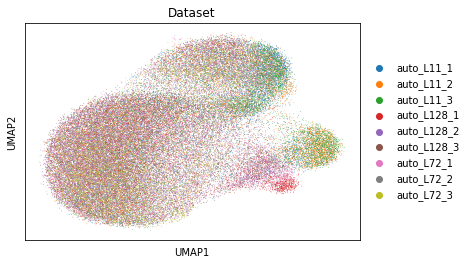

In [81]:
sc.pl.umap(adata_subset, color='Dataset')

In [82]:
sc.tl.leiden(adata_subset, resolution=1, key_added='cluster')


running Leiden clustering
    finished: found 8 clusters and added
    'cluster', the cluster labels (adata.obs, categorical) (0:02:07)


In [83]:
adata_subset.uns['cluster_colors'] = sc.pl.palettes.vega_20_scanpy[:len(np.unique(adata_subset.obs['cluster']))]

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_cluster']`


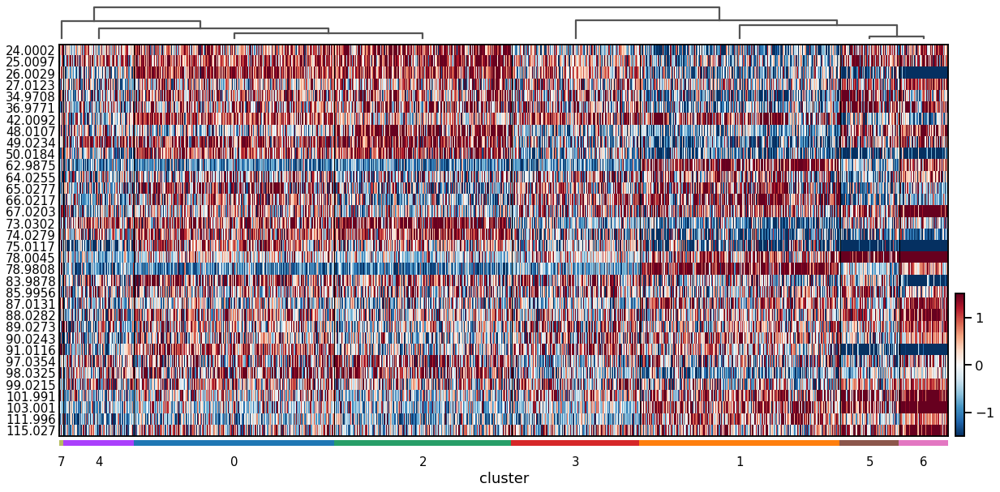

In [84]:
sc.tl.dendrogram(adata_subset, groupby='cluster')

with sns.plotting_context("talk", font_scale=1.):
    sc.pl.heatmap(
        adata_subset,
        adata_subset.var_names.tolist(),
        "cluster",
        dendrogram=True,
        cmap="RdBu_r",
        swap_axes=True, 
        figsize=(20,10),
        vmin=-1.5, 
        vmax=1.5,
    )

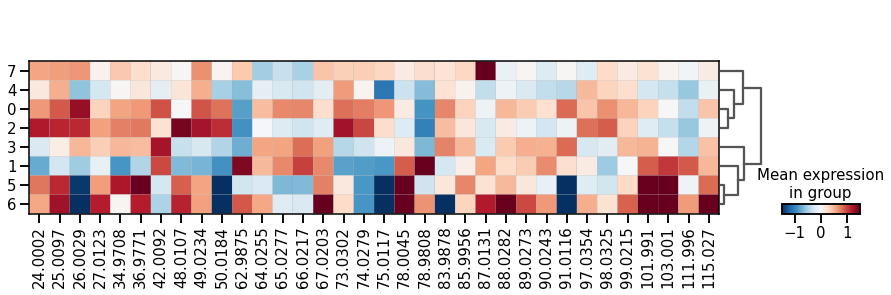

In [85]:
with sns.plotting_context("talk", font_scale=1.):
    sc.pl.matrixplot(
        adata_subset,
        adata_subset.var_names.tolist(),
        "cluster",
        dendrogram=True,
        cmap="RdBu_r",
        vmax=1.5,
        vmin=-1.5
    )

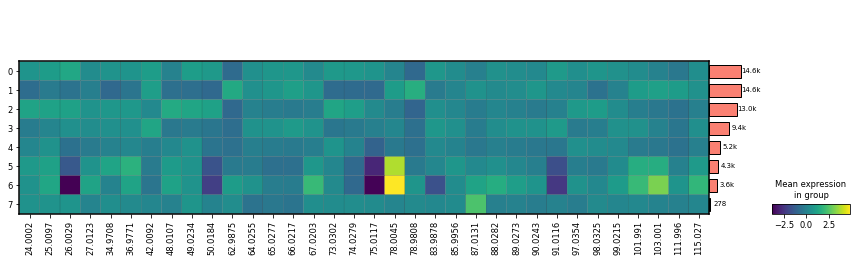

In [86]:
mp = sc.pl.matrixplot(adata_subset, adata_subset.var_names, groupby='cluster', cmap='bwr', return_fig=True)
mp.add_totals().style(edge_color='black').show()


In [87]:
# path = Path.cwd().parent / 'data' / 'clustering' / f'{experiment}_pixels_subset.h5ad'
# adata_subset.write(path)

# Propagate to whole dataset

In [88]:
import pynndescent
import pandas as pd 

def get_max_frequency_label(labels, neighs, n):
    df = pd.get_dummies(labels)
    dummies = df.values
    dummies_labels = np.array(df.columns.tolist())
    window = dummies[neighs]
    window = window.reshape(-1, n_neighbor, dummies.shape[1])
    window = window.sum(axis=1) / n_neighbor
    
    assert len(window) == len(neighs)
    return dummies_labels[np.argmax(window, axis=1)]

def missing_elements(X, L):
    start, end = 0, len(X)-1
    return sorted(set(range(start, end + 1)).difference(L))

In [89]:
# Define batch size
batch_size = 200000

# Get NNDescent index for fast projection
X_clustered = adata_subset.X
index = pynndescent.NNDescent(X_clustered)

# Get subset labels
labels = adata_subset.obs.cluster

In [90]:
not_sketch_index = missing_elements(X, sketch_index)

In [91]:
# Get non sketch samples
X_no_label = adata.X[not_sketch_index,:]
print(len(X), len(X_no_label), len(sketch_index))

1300734 1235698 65036


In [92]:
n_neighbor = 30

# project clusters
clustering = []
samples = X_no_label
for i in np.arange(0, samples.shape[0], batch_size):
    print(f"processing chunk {i}")
    cur_samples = samples[i : i + batch_size]
    neighs = index.query(cur_samples.astype(np.float32), k=n_neighbor)[0]
    clustering.append(
        get_max_frequency_label(labels, neighs, n_neighbor)
    )

processing chunk 0
processing chunk 200000
processing chunk 400000
processing chunk 600000
processing chunk 800000
processing chunk 1000000
processing chunk 1200000


In [93]:
full_labels = np.concatenate(clustering)

In [94]:
adata.obs['cluster'] = ''
adata.obs['cluster'][not_sketch_index] = full_labels
adata.obs['cluster'][sketch_index]  = labels

C:\Users\thu71\AppData\Local\Temp\ipykernel_13000\3946896152.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['cluster'][not_sketch_index] = full_labels
C:\Users\thu71\AppData\Local\Temp\ipykernel_13000\3946896152.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['cluster'][sketch_index]  = labels


In [95]:
adata.uns['cluster_colors'] = adata_subset.uns['cluster_colors']

In [96]:
# path = Path.cwd().parent / 'data' / 'clustering' / f'{experiment}_pixels_clusters.h5ad'
# adata.write(path)

# Show cluster result

In [97]:
from typing import Optional
import skimage 
from skimage import measure

def get_masks(mask_folder, dataset):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name and dataset in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks

def get_contour(mask: np.ndarray) :
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

def get_img_from_data(x: np.ndarray, y: np.ndarray, data: np.ndarray, pad: int = 0) -> np.ndarray:
    # X is row and Y col
    x_coord = x - x.min() + pad
    y_coord = y - y.min() + pad
    # create image
    img = np.zeros(
        (x_coord.max() + 1 + pad, y_coord.max() + 1 + pad, data.shape[-1]),
        dtype=data.dtype,
    )
    img[x_coord, y_coord] = data
    return img

def hex2rgb(h):
    """Convert hex color string to rgb tuple."""
    h = h.lstrip("#")
    return [int(h[i : i + 2], 16) for i in (0, 2, 4)]

def annotate_img(
    img: np.ndarray,
    annotation: Optional[pd.DataFrame] = None,
    from_col: str = "clustering",
    to_col: Optional[str] = None,
    color: bool = False,
) -> np.ndarray:
    """
    Annotate cluster image.
    Parameters
    ----------
    img
        Image to annotate.
    annotation
        :attr:`Cluster.cluster_annotation` containing mapping of classes to cluster names and colors.
    from_col
        Annotation column containing current values in image.
    to_col
        Annotation column containing desired mapping. If None, use ``from_col``.
    color
        If True, use annotation column ``to_col+"_colors"`` to get colormap and color image.
    Returns
    -------
    Annotated image.
    """
    if to_col is None:
        to_col = from_col
    if color:
        to_col = to_col + "_colors"
        res = np.zeros(img.shape + (3,), dtype=np.uint8)
    else:
        if from_col == to_col:
            # no need to change anything
            return img
        assert annotation is not None
        res = np.zeros_like(img, dtype=annotation[to_col].dtype)
    assert annotation is not None
    for _, row in annotation.iterrows():
        to_value = row[to_col]
        if color:
            to_value = hex2rgb(to_value)
        res[img == row[from_col]] = to_value
    return res.squeeze() if color else res

In [98]:
annotations = pd.DataFrame()
annotations['cluster'] = adata_subset.obs.cluster.cat.categories
annotations['cluster_colors'] = adata_subset.uns['cluster_colors']

In [99]:
annotations

,cluster,cluster_colors
0,0,#1f77b4
1,1,#ff7f0e
2,2,#279e68
3,3,#d62728
4,4,#aa40fc
5,5,#8c564b
6,6,#e377c2
7,7,#b5bd61


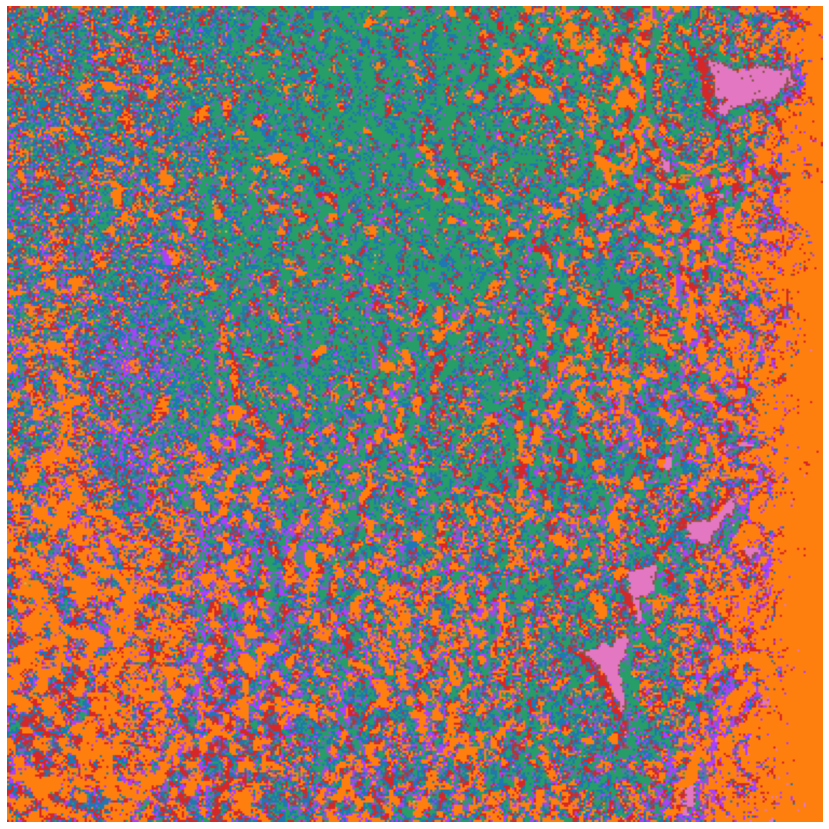

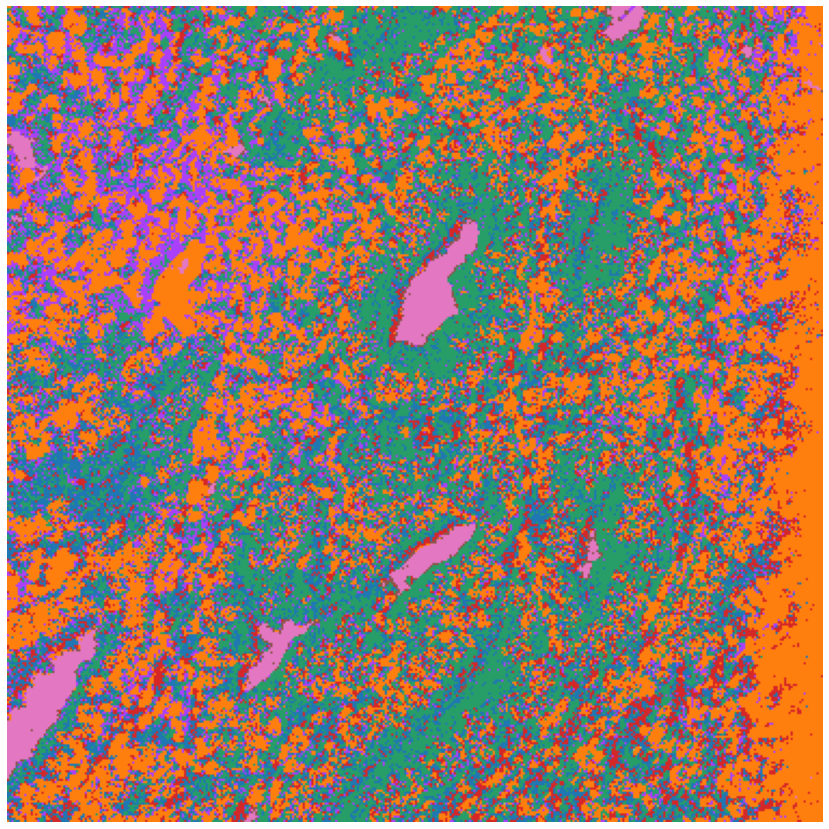

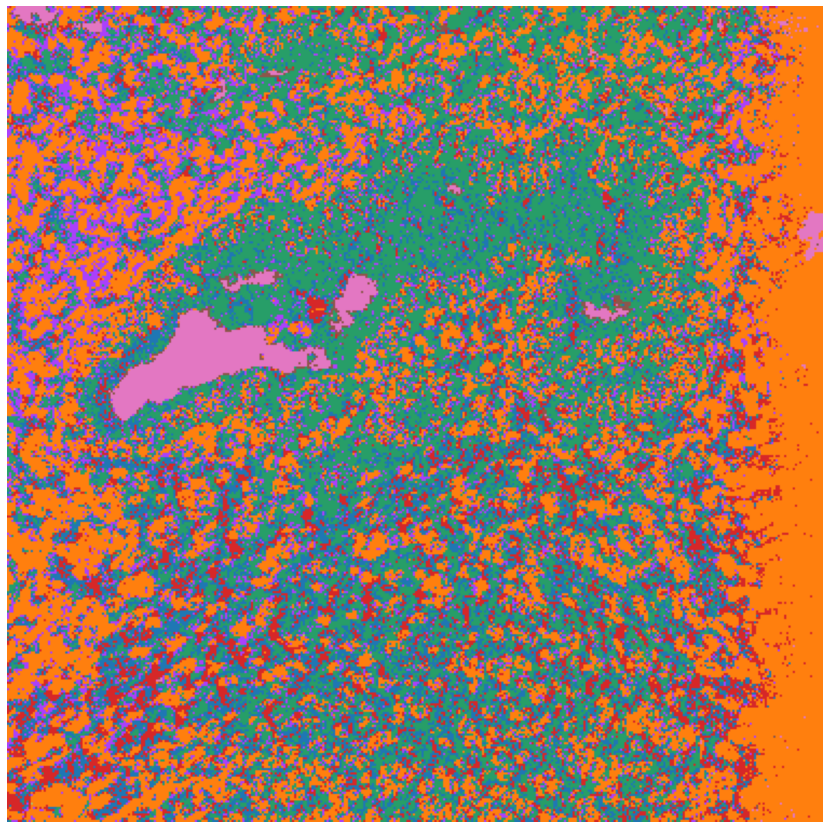

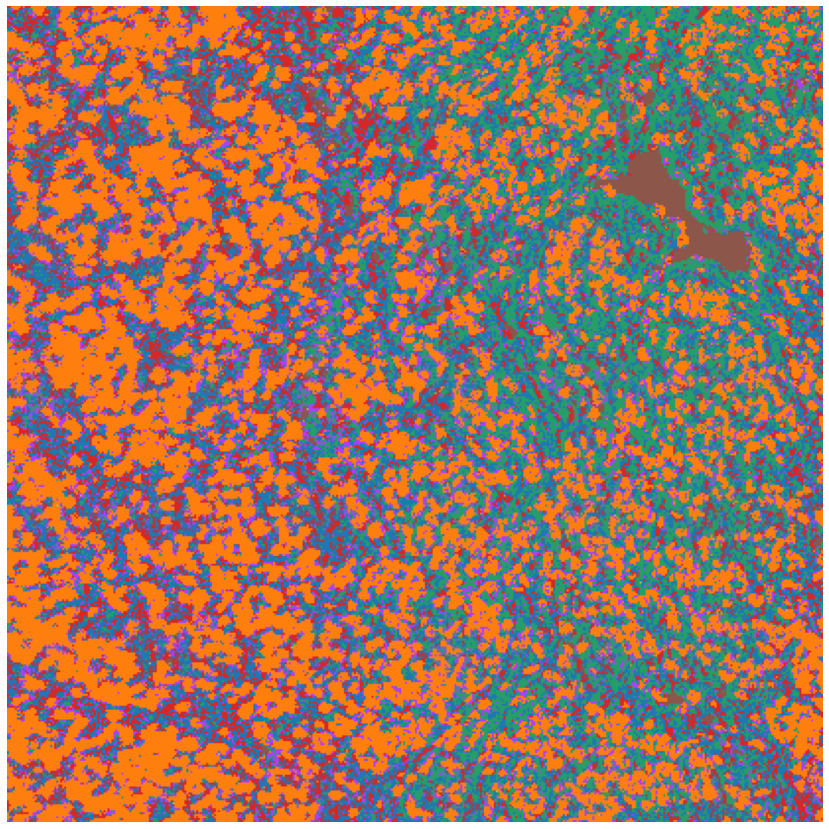

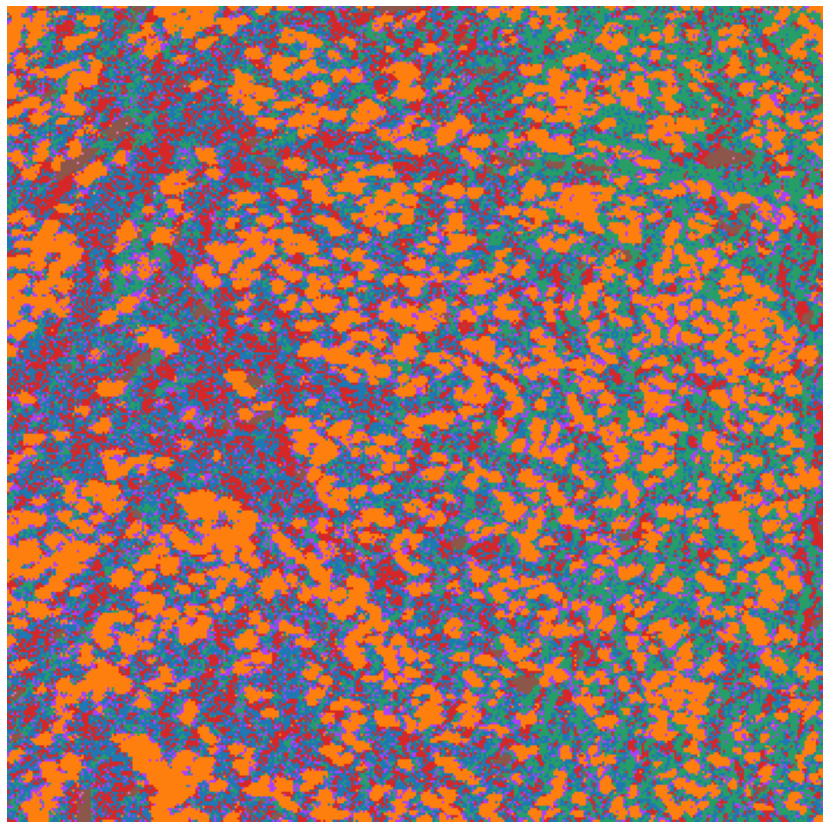

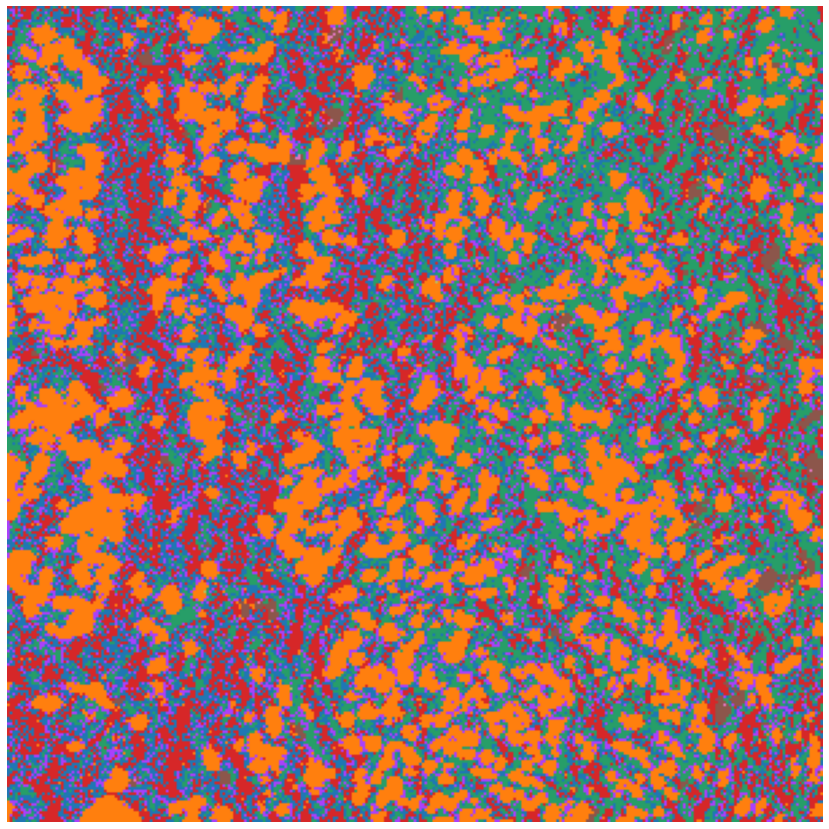

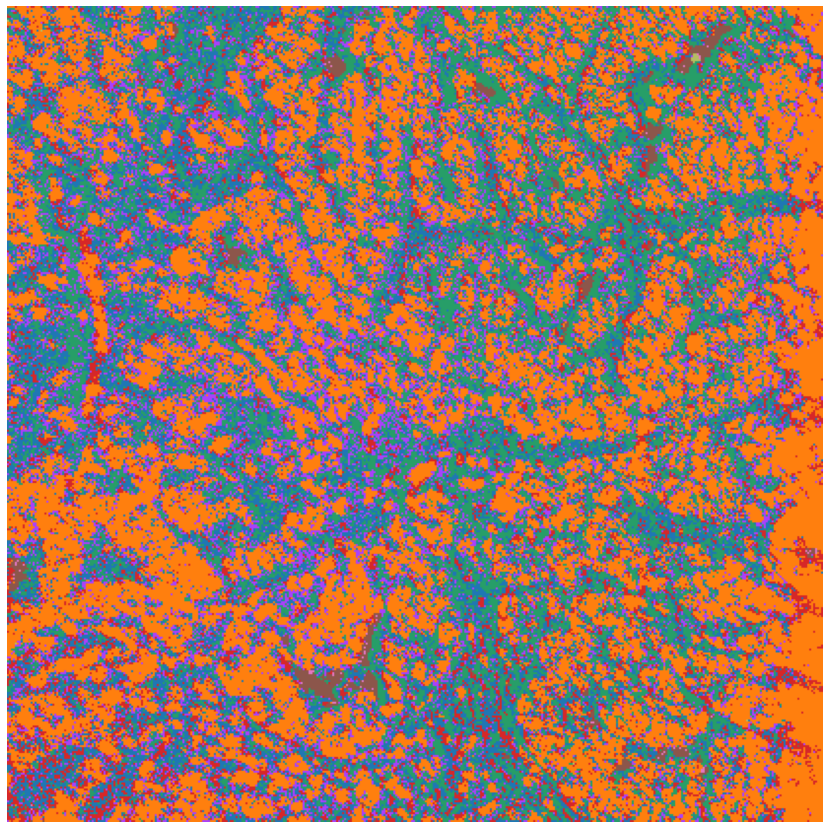

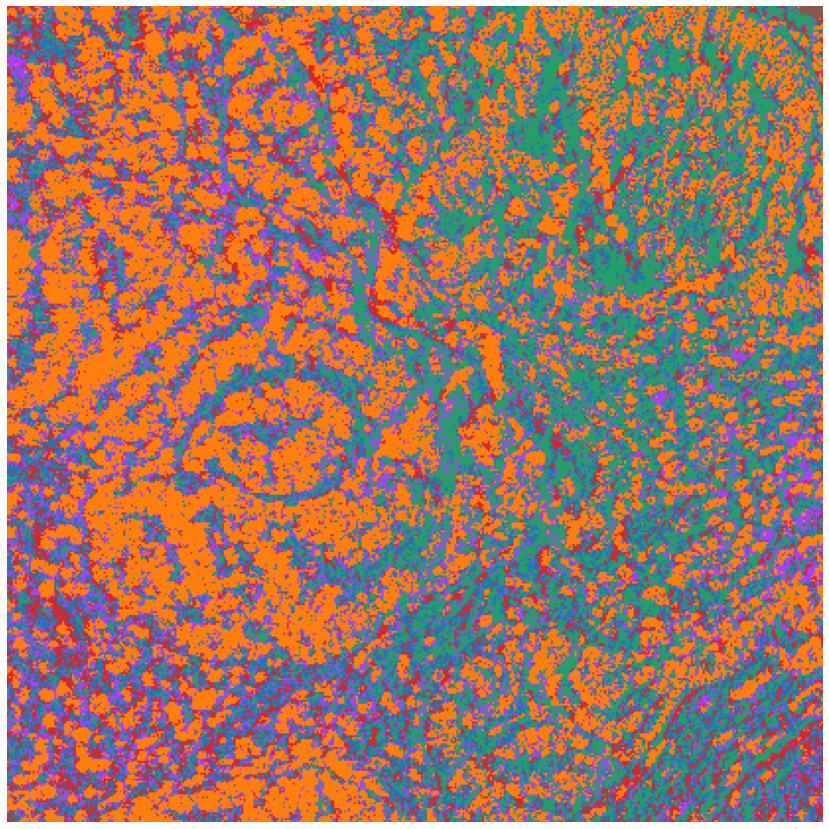

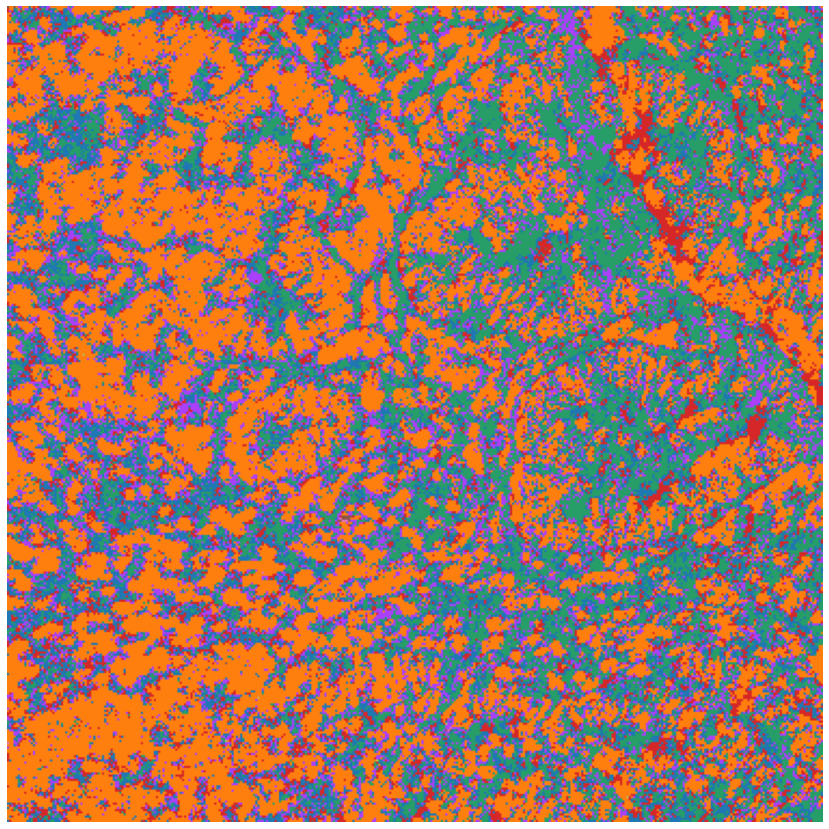

In [100]:
datasets = np.unique(adata.obs.Dataset)

for ii, dataset in enumerate(datasets):
    adata_fov = adata[adata.obs.Dataset == dataset]
    values = np.array(adata_fov.obs.cluster.values)
    
    img_cluster = values.reshape((int(np.sqrt(len(adata_fov))), int(np.sqrt(len(adata_fov)))))
    
    img_cluster_annotated = annotate_img(img_cluster, annotations, from_col='cluster', color=True)
    
    fig, ax = plt.subplots(figsize=(15,15))
    ax.imshow(img_cluster_annotated)
    ax.axis("off")
    ax.axis('off')
    plt.show()
    
    path = Path.cwd().parent / 'figures' / 'pixels' / f'{experiment}_{dataset}.tiff'
    skimage.io.imsave(path, img_cluster_annotated)